# Importing libraries 

In [50]:
# import data processing and visualisation libraries
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import pandas as pd

# import image processing libraries
import cv2
from PIL import Image

# import tensorflow and keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array,load_img
from tensorflow.keras.utils import to_categorical
import tensorflow as tf
import os
import random

#import from sklearn
from sklearn.model_selection import train_test_split

# Loading whole Data

In [6]:
DATA_DIR = "/kaggle/input/aslamerican-sign-language-aplhabet-dataset/ASL_Alphabet_Dataset/asl_alphabet_train"

# The content of training data

In [7]:
print(os.listdir(DATA_DIR)[:])

['N', 'R', 'space', 'B', 'I', 'del', 'F', 'H', 'E', 'U', 'M', 'X', 'K', 'Q', 'Y', 'S', 'G', 'A', 'O', 'T', 'V', 'Z', 'C', 'P', 'L', 'W', 'D', 'nothing', 'J']


# Checking for the corrupted data and the extentions of images in dataset  

In [8]:
def check_corruption(Training_data=DATA_DIR ):
    corrupted_images = []
    extentions = []
    
    sample_images = []
    
    num_samples_per_class = 1  # عدد الصور لكل class
    
    for class_name in os.listdir(Training_data):
        class_path = os.path.join(Training_data, class_name)
        if not os.path.isdir(class_path):
            continue
    
        class_imgs = []
        for img_name in os.listdir(class_path):
            img_path = os.path.join(class_path, img_name)
            root, extention = os.path.splitext(img_path)
            if extention not in extentions:
                extentions.append(extention)
            
            try:
                if os.path.isfile(img_path) and img_name.lower().endswith(('.png', '.jpg', '.jpeg')):
                    img = Image.open(img_path)
                    img.verify()
                    class_imgs.append(img_path)
            except Exception as es:
                corrupted_images.append(img_path)
                print(f"corrupted image path: {img_path}")
    
        # اختيار أكثر من صورة لكل class
        if class_imgs:
            sample_images.extend(random.sample(class_imgs, min(num_samples_per_class, len(class_imgs))))
    
    print(f"Number of corrupted images: {len(corrupted_images)}")
    print(f"Extensions found: {extentions}")

In [9]:
check_corruption()

Number of corrupted images: 0
Extensions found: ['.jpg', '.jpeg']


# Data Extraction

In [10]:
categories={0:'A',
           1:'B',
           2:'C',
           3:'D',
           4:'E',
            5:'F',
            6:'G',
            7:'H',
            8:'I',
            9:'J',
            10:'K',
            11:'L',
            12:'M',
            13:'N',
            14:'O',
            15:'P',
            16:'Q', 
            17:'R',
            18:'S',
            19:'T',
            20:'U',
            21:'V',
            22:'W',
            23:'X',
            24:'Y',
            25:'Z',
            26:'del',
            27:'nothing',
            28:'space'
           
           }

In [11]:
#function to store the image with the full path for easy reaching it during the training  
def add_classNames_prefix(df, col_name, base_path):
    df[col_name] = df.apply(lambda x: os.path.join(base_path, categories[x["Category"]], x["FileName"]), axis=1)
    return df
#list to lis the image name 
file_names_list=[]
#list to list the category of each image 
categories_list=[]

for category in categories:
    filenames=os.listdir(os.path.join(DATA_DIR,categories[category]))
    file_names_list+=filenames
    categories_list+=[category]*len(filenames)

df=pd.DataFrame({"FileName":file_names_list,"Category":categories_list})
df=add_classNames_prefix(df,"FileName",DATA_DIR)
#shuffle the images in the data frame for good training 
df = df.sample(frac=1).reset_index(drop=True)


In [12]:
df

,FileName,Category
0,/kaggle/input/aslamerican-sign-language-aplhab...,10
1,/kaggle/input/aslamerican-sign-language-aplhab...,20
2,/kaggle/input/aslamerican-sign-language-aplhab...,4
3,/kaggle/input/aslamerican-sign-language-aplhab...,3
4,/kaggle/input/aslamerican-sign-language-aplhab...,14
...,...,...
223069,/kaggle/input/aslamerican-sign-language-aplhab...,27
223070,/kaggle/input/aslamerican-sign-language-aplhab...,15
223071,/kaggle/input/aslamerican-sign-language-aplhab...,14
223072,/kaggle/input/aslamerican-sign-language-aplhab...,0


In [13]:
categories[df.Category[1]]

'U'

In [14]:
df.FileName[1]

'/kaggle/input/aslamerican-sign-language-aplhabet-dataset/ASL_Alphabet_Dataset/asl_alphabet_train/U/U604.jpg'

# Data Exploration 

 Showing images from classes in training dataset 

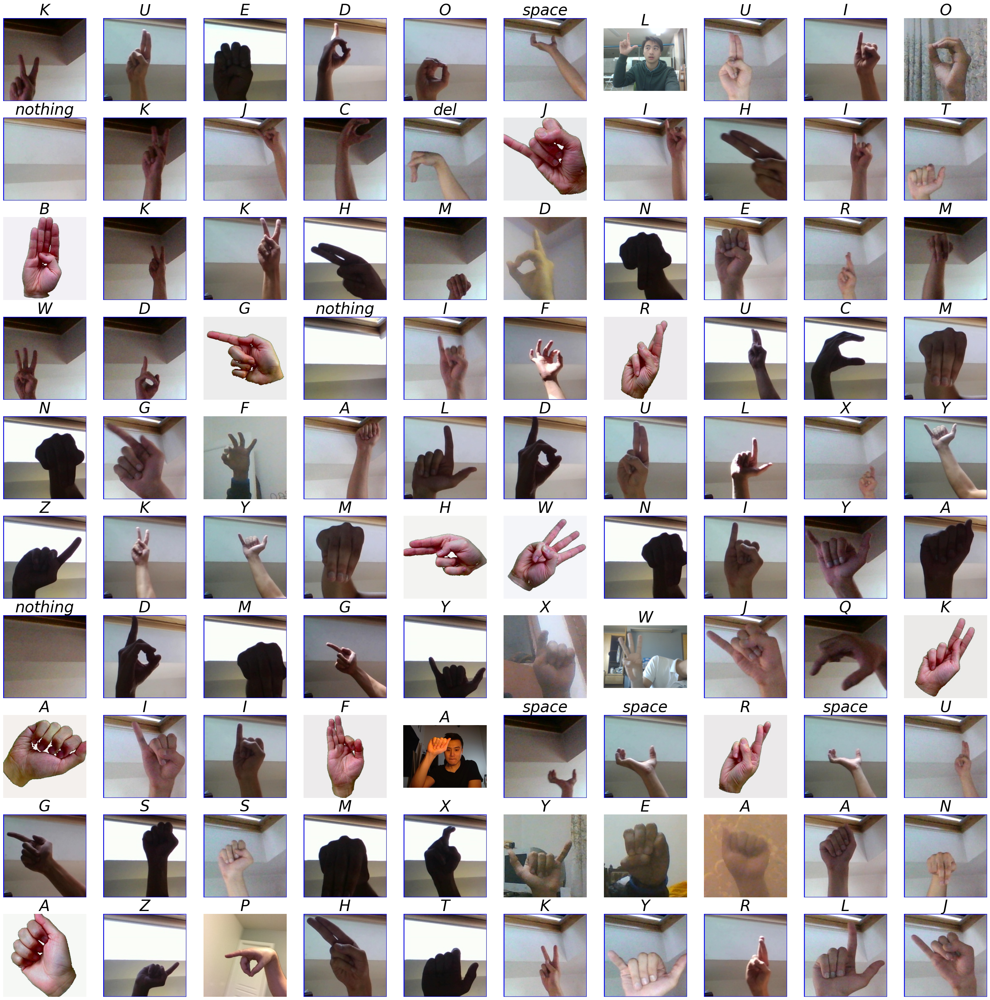

In [15]:
plt.figure(figsize=(40,40))
for i in range(100):
    path=df.FileName[i]
    img=plt.imread(path)
    plt.subplot(10,10,i+1)
    plt.imshow(img)
    plt.title(categories[df.Category[i]],fontsize=35,fontstyle='italic')
    plt.axis("off")

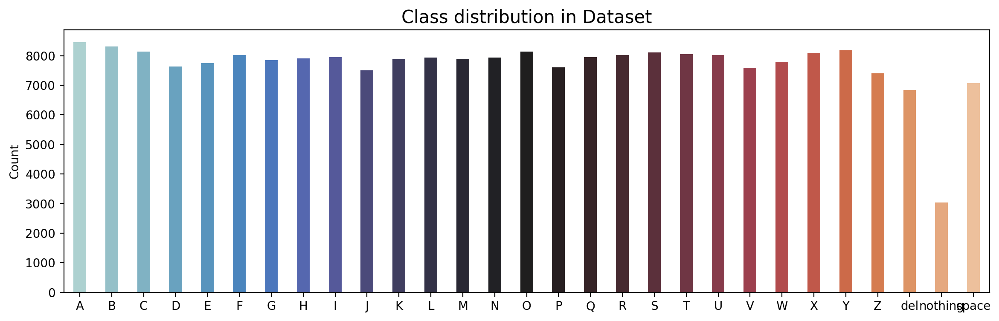

In [70]:
label,count = np.unique(df.Category,return_counts=True)
uni = pd.DataFrame(data=count,index=categories.values(),columns=['Count'])

plt.figure(figsize=(14,4),dpi=200)
sns.barplot(data=uni,x=uni.index,y='Count',palette='icefire',width=0.4).set_title('Class distribution in Dataset',fontsize=15)
plt.show()

# Preprocessing Traing data 

1-showing the original size of images 

In [18]:
img_shapes = []

for path in df["FileName"]:  
    img = cv2.imread(path)    
    if img is not None:       
        img_shapes.append(img.shape)  

print(set(img_shapes)) 


{(400, 400, 3), (200, 150, 3), (200, 200, 3), (480, 640, 3), (1920, 1920, 3), (720, 1280, 3)}


2- function to resize images 

In [38]:
def load_data_from_df(df, img_size=64, grayscale=True):
    data = []
    labels = []

    classes = sorted(df["Category"].unique())
    class_to_index = {cls: idx for idx, cls in enumerate(classes)}

    for _, row in df.iterrows():
        try:
            if grayscale:
                img = cv2.imread(row["FileName"], cv2.IMREAD_GRAYSCALE)
                img = cv2.resize(img, (img_size, img_size))
                img = img / 255.0
                img = np.expand_dims(img, axis=-1)
            else:
                img = cv2.imread(row["FileName"])
                img = cv2.resize(img, (img_size, img_size))
                img = img / 255.0

            data.append(img)
            labels.append(class_to_index[row["Category"]])
        except:
            pass
    
    return np.array(data, dtype="float32"), np.array(labels), classes


In [40]:
#calling function
data, labels, classes=load_data_from_df(df)

In [42]:
#shape of the all images after the convertion into matrix
data.shape

(223074, 64, 64, 1)

In [34]:
data

array([[[[0.10980392],
         [0.10588235],
         [0.10588235],
         ...,
         [0.10980392],
         [0.11764706],
         [0.12941177]],

        [[0.11372549],
         [0.05490196],
         [0.03137255],
         ...,
         [0.19607843],
         [0.22745098],
         [0.2       ]],

        [[0.10980392],
         [0.08235294],
         [0.05882353],
         ...,
         [0.20784314],
         [0.19215687],
         [0.20392157]],

        ...,

        [[0.13333334],
         [0.5372549 ],
         [0.5411765 ],
         ...,
         [0.85882354],
         [0.8627451 ],
         [0.88235295]],

        [[0.13333334],
         [0.5294118 ],
         [0.5294118 ],
         ...,
         [0.85490197],
         [0.85490197],
         [0.87058824]],

        [[0.14509805],
         [0.5411765 ],
         [0.53333336],
         ...,
         [0.8745098 ],
         [0.88235295],
         [0.8901961 ]]],


       [[[0.09019608],
         [0.13333334],
         [0.12

In [41]:
#the output labels are 29 class
labels

array([10, 20,  4, ..., 14,  0, 14])

In [37]:
classes

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28]

# showing an image after applying the preproccing   

TypeError: only integer scalar arrays can be converted to a scalar index

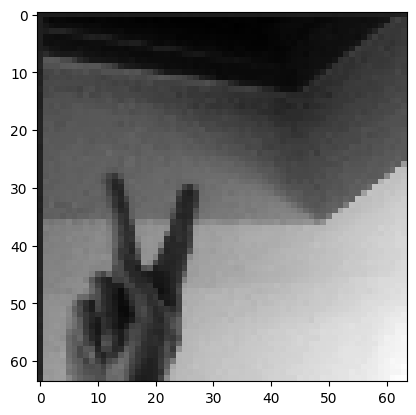

In [67]:
plt.imshow(data[0].squeeze(), cmap="gray")  
plt.title(f"Label: {classes[data[0]]}")   
plt.axis("off") 
plt.show()


3- convert labels into one hot encodded classes

In [46]:
Y = to_categorical(labels, num_classes=len(classes))

In [47]:
Y

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [68]:
Y.shape

(223074, 29)

# splitting data into training ,testing ,validation

In [63]:
X_train,X_temp,y_train,y_temp=train_test_split(data,Y,test_size=0.3,random_state=42)
X_val,X_test,y_val,y_test=train_test_split(X_temp,y_temp,test_size=0.5,random_state=42)

In [61]:
X_train.shape

(156151, 64, 64, 1)

In [64]:
X_test.shape

(33462, 64, 64, 1)

In [66]:
# Checking the dimensions of all the variables
print(X_train.shape)
print(y_train.shape)
print(X_val.shape)
print(y_val.shape)
print(X_test.shape)
print(y_test.shape)


(156151, 64, 64, 1)
(156151, 29)
(33461, 64, 64, 1)
(33461, 29)
(33462, 64, 64, 1)
(33462, 29)


# Display some images after preprocessing 

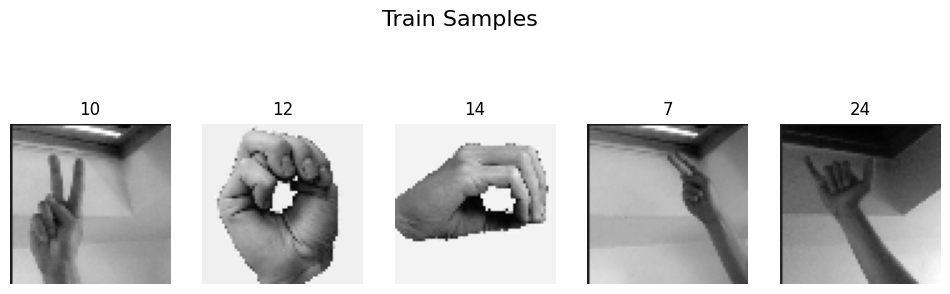

In [65]:
def show_samples(X, y, classes, n=5, title="Samples"):
    plt.figure(figsize=(12, 4))
    for i in range(n):
        plt.subplot(1, n, i+1)
        plt.imshow(X[i].squeeze(), cmap="gray")  # squeeze() لو الصور grayscale
        # Decode the one-hot encoded label back to an integer index
        class_index = np.argmax(y[i])
        plt.title(classes[class_index])
        plt.axis("off")
    plt.suptitle(title, fontsize=16)
    plt.show()

# عرض عينات من Train
show_samples(X_train, y_train, classes, n=5, title="Train Samples")